Question 1

الف )

True

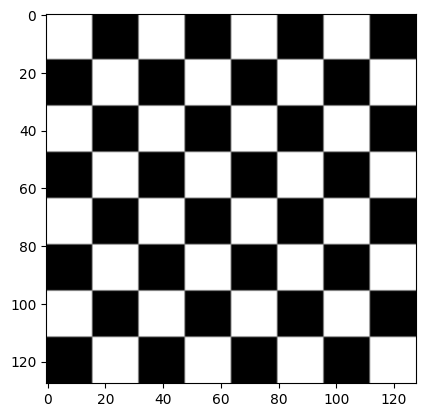

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
black = np.zeros((100,100), dtype=np.uint8 ) #0-255
white = np.ones((16,16), dtype=np.uint8 )
black[0:16 , 0:16] = white #corner
black[16:32 , 16:32] = white #diagonally
square = black[0:32 , 0:32]

chess = np.tile(square, (4,4))
plt.imshow(chess, cmap = "gray")
cv2.imwrite("chessboard.jpg", chess)

ب )

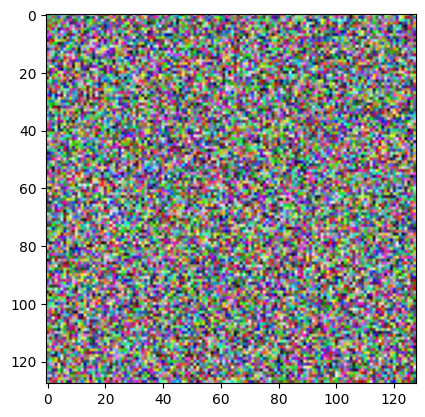

True

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
img = np.random.randint(0,255, size = (128,128,3))
plt.imshow(img)
plt.show()
cv2.imwrite("Random_Color.jpg", img)

پ )

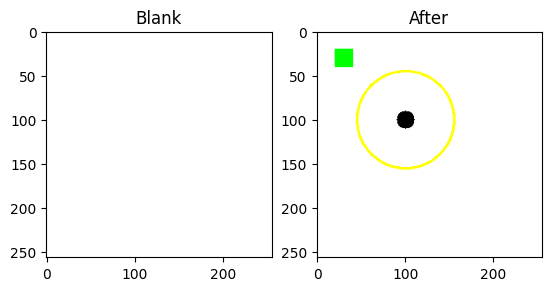

True

In [ ]:
from matplotlib.widgets import Circle
import cv2
import numpy as np
import matplotlib.pyplot as plt
def makeShape(image,shape,location,size,thick,colors):
    if(shape == 'circle'):
        cv2.circle(image, center = location, radius = size, thickness = thick, color = colors)
    
    if(shape == 'rectangle'):
       cv2.rectangle(image, location, size, color = colors, thickness = thick)
    
    return image
img = (np.ones((256,256,3)) * 255).astype("uint8")
fig, ax = plt.subplots(1,2)
ax[0].imshow(img)
makeShape(img,'circle',(100,100),55,2,(0,255,255))
makeShape(img,'rectangle',(20,20),(40,40),-1,(0,255,0))
makeShape(img,'circle',(100,100),10,-1,(0,0,0))
ax[1].imshow(img[...,::-1])
ax[1].set_title("After")
ax[0].set_title("Blank")
plt.show()
cv2.imwrite("Making_Shapes.jpg", img)

Question 2

الف )

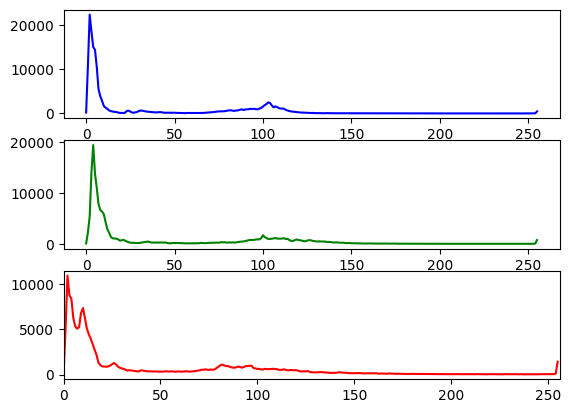

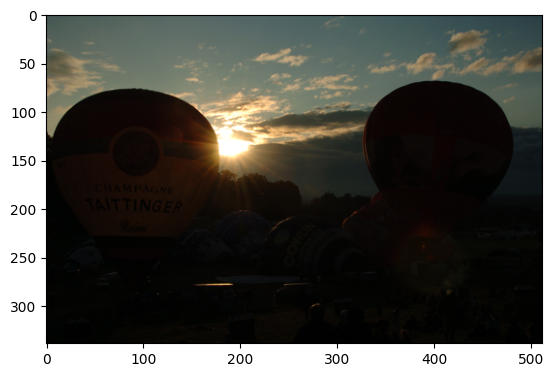

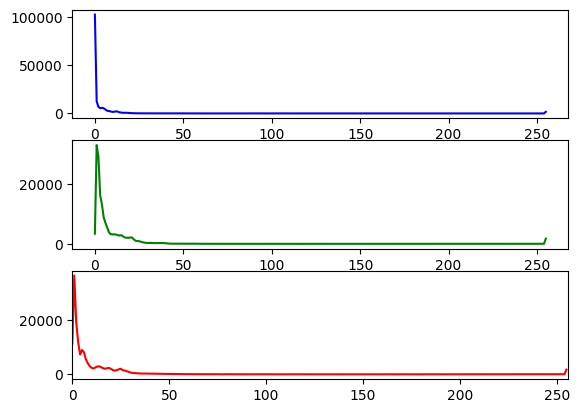

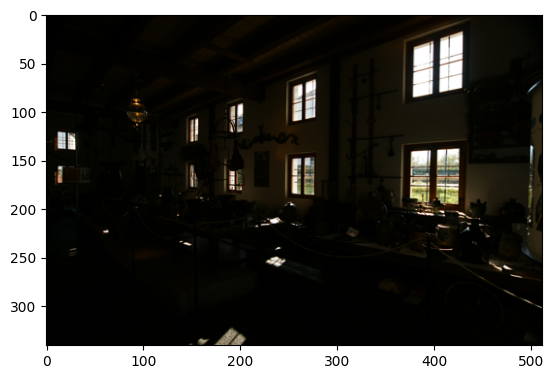

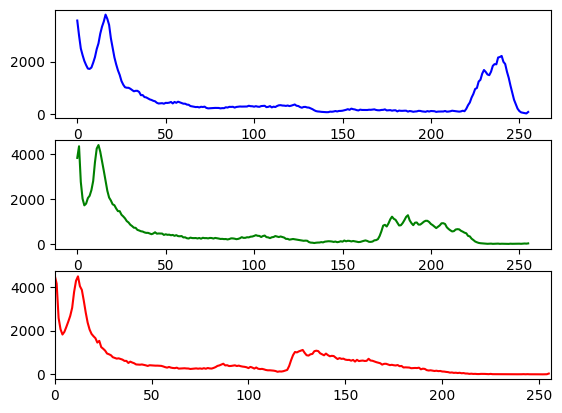

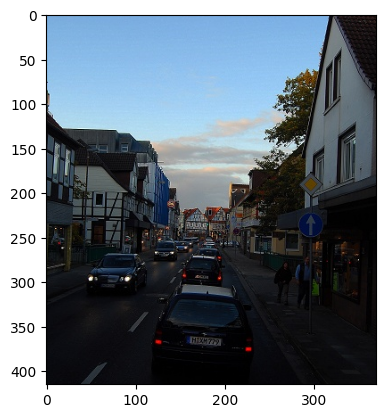

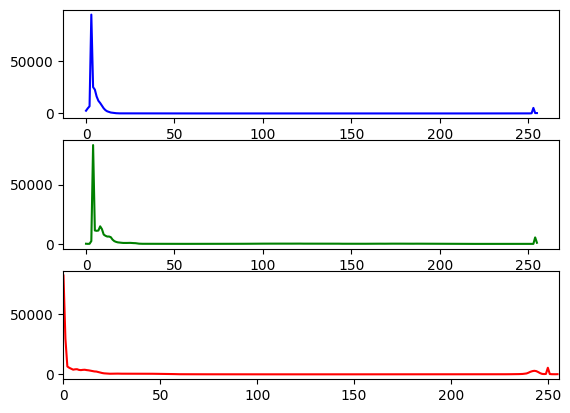

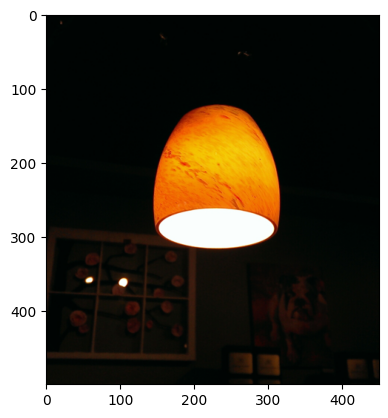

In [ ]:
import numpy as np
import cv2 as cv
from matplotlib import pyplot as plt

def Histogram(img,plotNumber):
    color = ('b','g','r')
    fig, ax = plt.subplots(3,1)
    for i,col in enumerate(color):
        histr = cv.calcHist([img],[i],None,[256],[0,256])
        ax[i].plot(histr,color = col)
        plt.xlim([0,256])
    plt.figure(plotNumber)
    plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))  
    plt.show()  
    return 

img1 = cv.imread('Balloons.jpg')
img2 = cv.imread('Farmhouse.jpg')
img3 = cv.imread('cars.jpg')
img4 = cv.imread('lamp.jpg')

Histogram(img1,2)
Histogram(img2,4)
Histogram(img3,6)
Histogram(img4,8)

 ب )

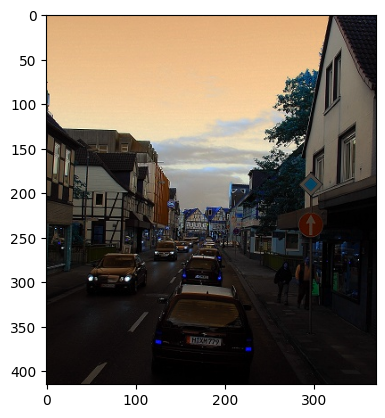

In [ ]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

def Normalize(img):
    maximum_value, minimum_value = img.max(), img.min()
    normalized_image = np.zeros_like(img.astype(float))
    normalized_image[:, :, :] = (img[:, :, :] - float(minimum_value)) / float(maximum_value - minimum_value)
    plt.imshow(normalized_image)  
    normalized_image

image = cv.imread('cars.jpg')
Normalize(image)

پ )

CLAHE

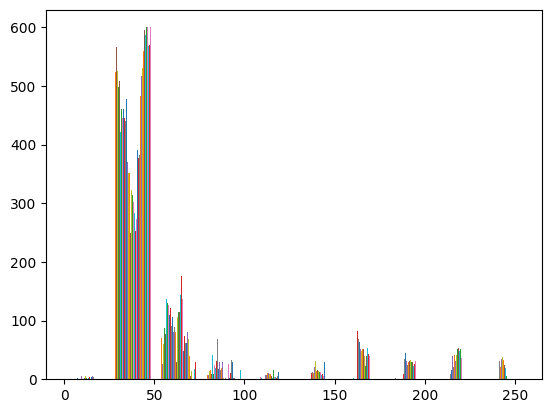

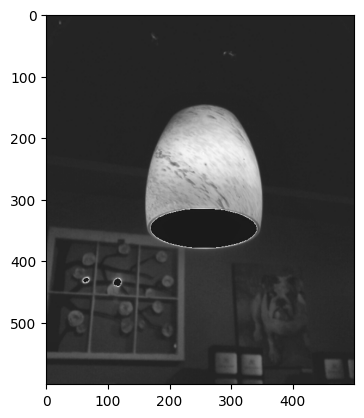

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

image = cv2.imread("lamp.jpg")
# Resizing the image for compatibility
image = cv2.resize(image, (500, 600))

# The initial processing of the image
image_bw = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# The declaration of CLAHE
# clipLimit -> Threshold for contrast limiting
clahe = cv2.createCLAHE(clipLimit=1)
final_img = clahe.apply(image_bw) + 30

plt.figure(1)
plt.hist(final_img)
plt.figure(2)
plt.imshow(cv2.cvtColor(final_img, cv2.COLOR_BGR2RGB))



GHE

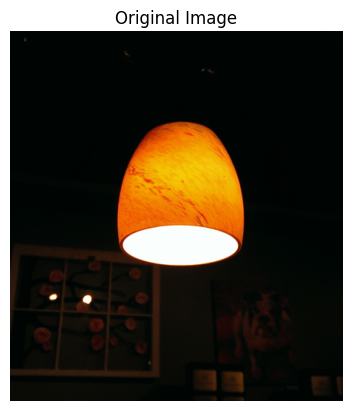

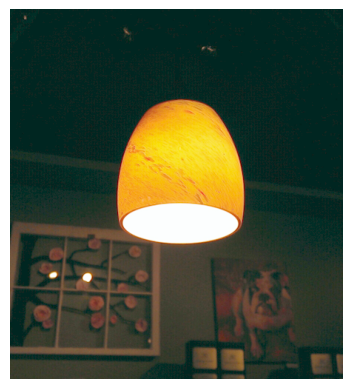

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

#this function replaces each pixel in the image with its gamma correcteed version using a lookup table
def gamma(img,g=1.00):
    invGamma = 1.0 / g
    table = np.array([((i / 255.0) ** invGamma) * 255
        for i in np.arange(0, 256)]).astype("uint8")
    return cv2.LUT(image, table)


image = cv2.imread('lamp.jpg',1)
plt.axis("off")
plt.title("Original Image")
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()

plt.axis("off")
image = gamma(image,2.2)
plt
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.show()


BBHE

Text(0.5, 1.0, ' histogram equalization ')

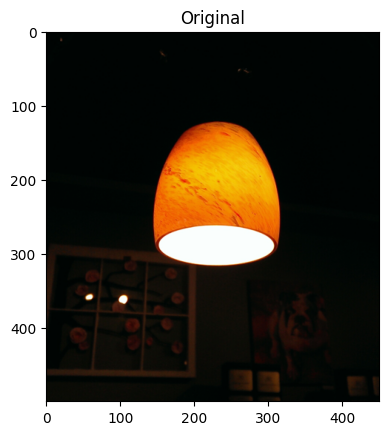

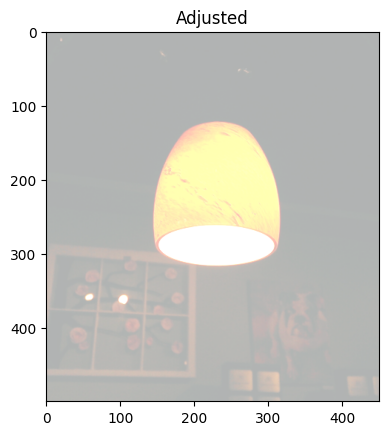

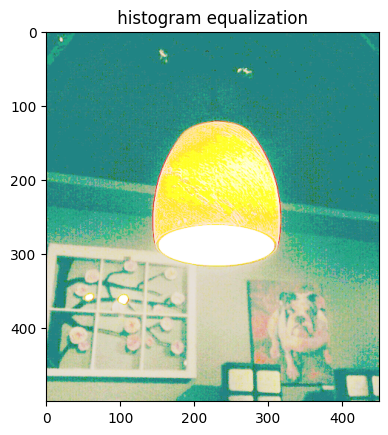

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def apply_brightness_contrast(img, brightness=0, contrast=0):
    # apply brightness and contrast adjustment using the following formula:
    # output = alpha * input + beta, where alpha = contrast, beta = brightness
    alpha = float(contrast) / 50
    beta = 127 + brightness
    adjusted_img = cv2.addWeighted(img, alpha, np.zeros(img.shape, img.dtype), 0, beta)
    return adjusted_img

def bb_histogram_equalization(img, brightness=0, contrast=0):
    # apply brightness and contrast adjustment to the image
    img_adjusted = apply_brightness_contrast(img, brightness, contrast)
    
    # compute the grayscale histogram of the adjusted image
    hist, bins = np.histogram(img_adjusted.flatten(), 256, [0, 256])
    
    # compute the cumulative distribution function (CDF) of the histogram
    cdf = hist.cumsum()
    cdf_normalized = cdf / cdf.max()
    
    # apply histogram equalization using the CDF
    table = (np.array([((cdf_normalized[i] - cdf_normalized[0]) /
                       (1 - cdf_normalized[0])) * 255 for i in np.arange(0, 256)]).astype("uint8"))
    img_equalized = cv2.LUT(img_adjusted, table)
    
    return img_equalized

# load an example image
img = cv2.imread("lamp.jpg")

# apply brightness and contrast adjustment with brightness=50 and contrast=30
img_adjusted = apply_brightness_contrast(img, brightness=50, contrast=30)

# apply Brightness and Contrast adjustment using Histogram Equalization
img_equalized = bb_histogram_equalization(img, brightness=50, contrast=30)


plt.figure(1)
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.title("Original")
plt.figure(2)
plt.imshow(cv2.cvtColor(img_adjusted, cv2.COLOR_BGR2RGB))
plt.title("Adjusted")
plt.figure(3)
plt.imshow(cv2.cvtColor(img_equalized, cv2.COLOR_BGR2RGB))
plt.title(" histogram equalization ")

Question 3

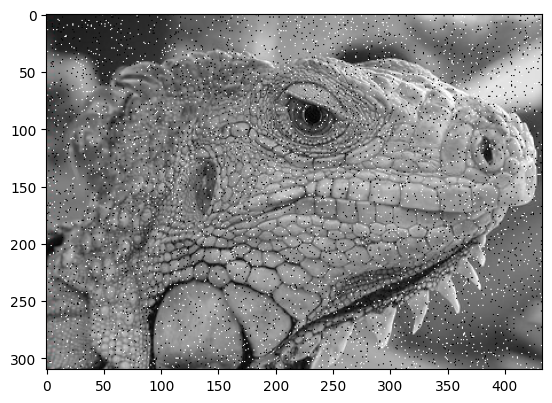

In [ ]:
import cv2
import numpy as np

def add_salt_and_pepper_noise(img, noise_amount):
    # create a copy of the input image
    img_noisy = np.copy(img)
    
    # generate a random mask with salt and pepper noise
    mask = np.random.choice([0, 1, 2], size=img.shape[:2], p=[noise_amount/2, noise_amount/2, 1-noise_amount])
    mask = mask[..., np.newaxis]
    mask = np.tile(mask, [1, 1, 3])
    
    # apply the mask to the image
    img_noisy[mask == 0] = 0
    img_noisy[mask == 1] = 255
    
    return img_noisy

# load an example image
img = cv2.imread("iguana.png")

# add salt and pepper noise with a noise amount of 0.05
img_noisy = add_salt_and_pepper_noise(img, noise_amount=0.05)

# display the original and noisy images side-by-side
plt.imshow(img)
plt.imshow(img_noisy)

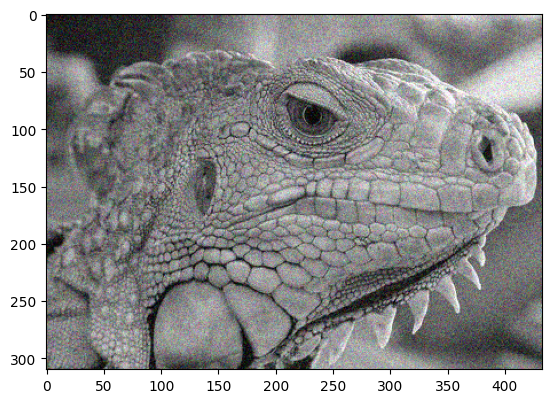

In [ ]:
import cv2
import numpy as np

def add_random_noise(img, noise_amount):
    # create a copy of the input image
    img_noisy = np.copy(img)
    
    # generate random noise with a normal distribution
    noise = np.random.normal(scale=noise_amount, size=img.shape)
    
    # add the noise to the image
    img_noisy = np.clip(img_noisy + noise, 0, 255).astype(np.uint8)
    
    return img_noisy

# load an example image
img = cv2.imread("iguana.png")

# add random noise with a noise amount of 20
img_noisy = add_random_noise(img, noise_amount=20)

# display the original and noisy images side-by-side
plt.imshow(img)
plt.imshow(img_noisy)

In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np


def imconvolution(img, kernel_size = 3, stride=1, mode = "mean"):
    img_noisy2=img[:,:,0]
    H,W = img_noisy2.shape[:2]
    
    fm_H = np.floor((H - kernel_size) / stride + 1).astype(int)
    fm_W = np.floor((W - kernel_size) / stride + 1).astype(int)
    featuremap = np.zeros((fm_H,fm_W))

    if mode == "mean":
        f = np.ones((kernel_size, kernel_size)) / (kernel_size ** 2)
        for i in range(int(fm_H)):
            for j in range(int(fm_W)):
                patch = img_noisy2[i * stride : (i * stride) + kernel_size, j * stride : (j * stride) + kernel_size]
                patch = np.sum(patch * f)
                featuremap[i,j] = patch
                
    elif mode == "median":
        for i in range(int(fm_H)):
            for j in range(int(fm_W)):
                patch = img_noisy2[i * stride : (i * stride) + kernel_size, j * stride : (j * stride) + kernel_size]
                patch = np.median(patch)
                featuremap[i,j] = patch
                
    elif mode == "gaussian":
        f = np.random.rand(fm_H, fm_W)
        f = f / np.sum(f)
        for i in range(int(fm_H)):
            for j in range(int(fm_W)):
                patch = img_noisy2[i * stride : (i * stride) + kernel_size, j * stride : (j * stride) + kernel_size]
                patch = np.median(patch)
                featuremap[i,j] = patch
        

    return featuremap



Text(0.5, 1.0, 'noisy Image')

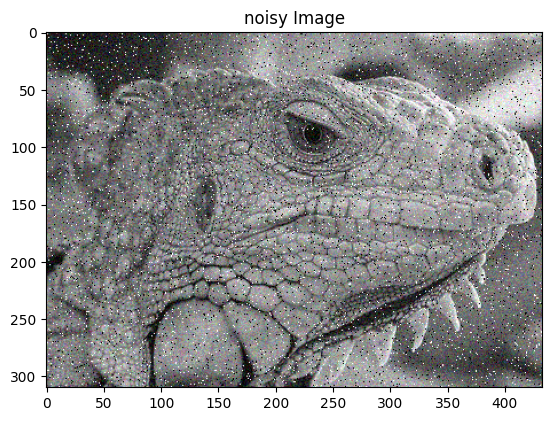

In [ ]:
img = cv2.imread("iguana.png")
img_noisy1 = add_random_noise(img, noise_amount=20)
img_noisy2 = add_salt_and_pepper_noise(img_noisy1, noise_amount=0.05)
plt.imshow(img_noisy2)
plt.title('noisy Image')

Mean Filter

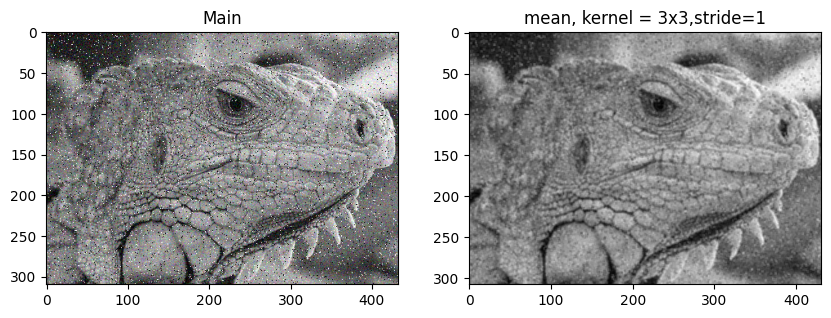

In [ ]:
#filtersize= 3*3 , stride=1
k = 3
stride=1
mode = "mean"
out = imconvolution(img_noisy2, kernel_size = k,stride=stride, mode = mode)
fig, ax = plt.subplots(1,2, figsize =(10,12))
ax[0].imshow(cv2.cvtColor(img_noisy2, cv2.COLOR_BGR2RGB), cmap= "gray")
ax[1].imshow(out, cmap = "gray")
ax[0].set_title("Main")
ax[1].set_title(f"{mode}, kernel = {k}x{k},stride={stride}")
plt.show()

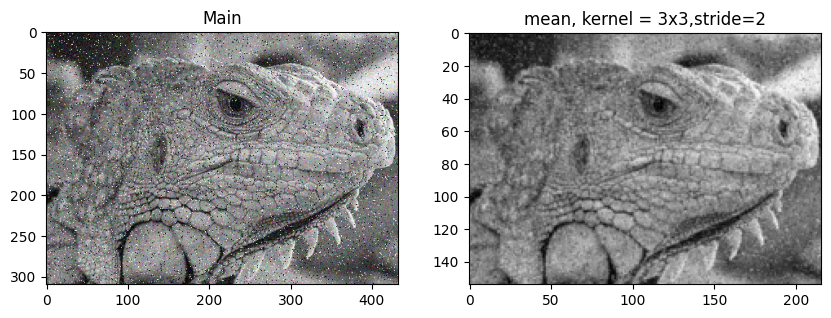

In [ ]:
#filtersize= 3*3 , stride=2
k = 3
stride=2
mode = "mean"
out = imconvolution(img_noisy2, kernel_size = k,stride=stride, mode = mode)
fig, ax = plt.subplots(1,2, figsize =(10,12))
ax[0].imshow(cv2.cvtColor(img_noisy2, cv2.COLOR_BGR2RGB), cmap= "gray")
ax[1].imshow(out, cmap = "gray")
ax[0].set_title("Main")
ax[1].set_title(f"{mode}, kernel = {k}x{k},stride={stride}")
plt.show()

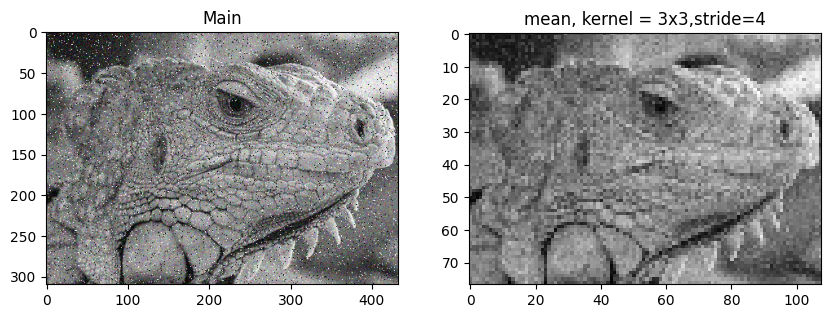

In [ ]:
#filtersize= 3*3 , stride=4
k = 3
stride=4
mode = "mean"
out = imconvolution(img_noisy2, kernel_size = k,stride=stride, mode = mode)
fig, ax = plt.subplots(1,2, figsize =(10,12))
ax[0].imshow(cv2.cvtColor(img_noisy2, cv2.COLOR_BGR2RGB), cmap= "gray")
ax[1].imshow(out, cmap = "gray")
ax[0].set_title("Main")
ax[1].set_title(f"{mode}, kernel = {k}x{k},stride={stride}")
plt.show()

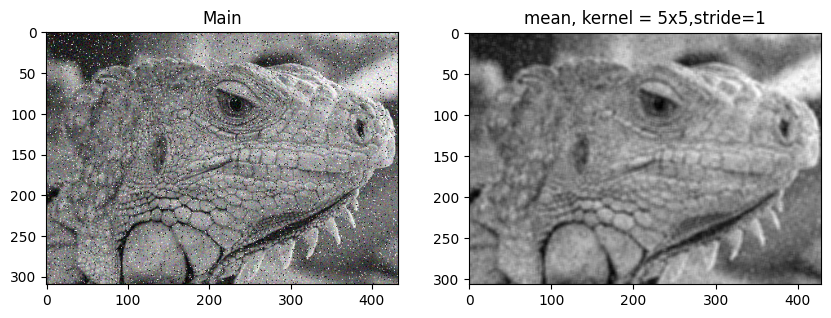

In [ ]:
#filtersize= 5*5 , stride=1
k = 5
stride=1
mode = "mean"
out = imconvolution(img_noisy2, kernel_size = k,stride=stride, mode = mode)
fig, ax = plt.subplots(1,2, figsize =(10,12))
ax[0].imshow(cv2.cvtColor(img_noisy2, cv2.COLOR_BGR2RGB), cmap= "gray")
ax[1].imshow(out, cmap = "gray")
ax[0].set_title("Main")
ax[1].set_title(f"{mode}, kernel = {k}x{k},stride={stride}")
plt.show()

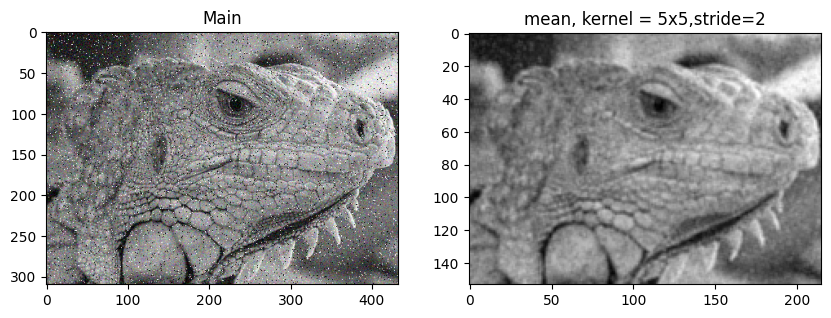

In [ ]:
#filtersize= 5*5 , stride=2
k = 5
stride=2
mode = "mean"
out = imconvolution(img_noisy2, kernel_size = k,stride=stride, mode = mode)
fig, ax = plt.subplots(1,2, figsize =(10,12))
ax[0].imshow(cv2.cvtColor(img_noisy2, cv2.COLOR_BGR2RGB), cmap= "gray")
ax[1].imshow(out, cmap = "gray")
ax[0].set_title("Main")
ax[1].set_title(f"{mode}, kernel = {k}x{k},stride={stride}")
plt.show()

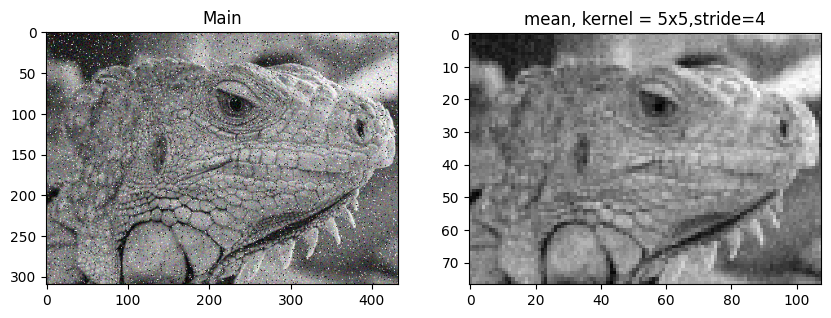

In [ ]:
#filtersize= 5*5 , stride=4
k = 5
stride=4
mode = "mean"
out = imconvolution(img_noisy2, kernel_size = k,stride=stride, mode = mode)
fig, ax = plt.subplots(1,2, figsize =(10,12))
ax[0].imshow(cv2.cvtColor(img_noisy2, cv2.COLOR_BGR2RGB), cmap= "gray")
ax[1].imshow(out, cmap = "gray")
ax[0].set_title("Main")
ax[1].set_title(f"{mode}, kernel = {k}x{k},stride={stride}")
plt.show()

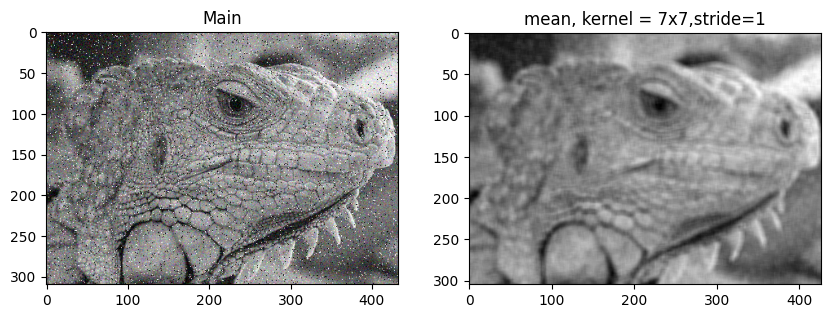

In [ ]:
#filtersize= 7*7 , stride=1
k = 7
stride=1
mode = "mean"
out = imconvolution(img_noisy2, kernel_size = k,stride=stride, mode = mode)
fig, ax = plt.subplots(1,2, figsize =(10,12))
ax[0].imshow(cv2.cvtColor(img_noisy2, cv2.COLOR_BGR2RGB), cmap= "gray")
ax[1].imshow(out, cmap = "gray")
ax[0].set_title("Main")
ax[1].set_title(f"{mode}, kernel = {k}x{k},stride={stride}")
plt.show()

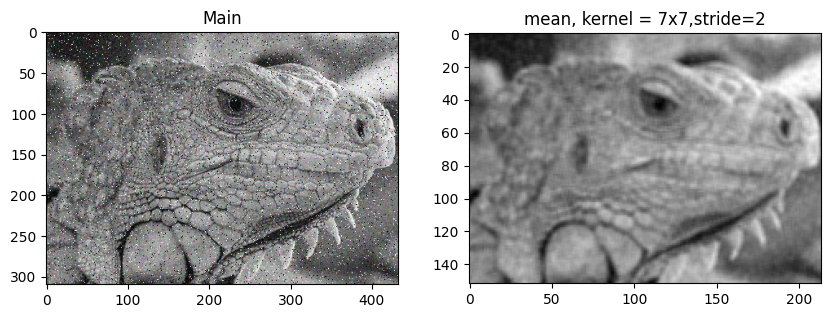

In [ ]:
#filtersize= 7*7 , stride=2
k = 7
stride=2
mode = "mean"
out = imconvolution(img_noisy2, kernel_size = k,stride=stride, mode = mode)
fig, ax = plt.subplots(1,2, figsize =(10,12))
ax[0].imshow(cv2.cvtColor(img_noisy2, cv2.COLOR_BGR2RGB), cmap= "gray")
ax[1].imshow(out, cmap = "gray")
ax[0].set_title("Main")
ax[1].set_title(f"{mode}, kernel = {k}x{k},stride={stride}")
plt.show()

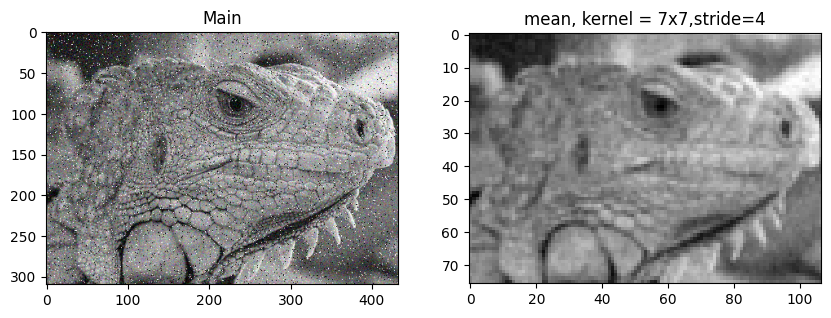

In [ ]:
#filtersize= 7*7 , stride=4
k = 7
stride=4
mode = "mean"
out = imconvolution(img_noisy2, kernel_size = k,stride=stride, mode = mode)
fig, ax = plt.subplots(1,2, figsize =(10,12))
ax[0].imshow(cv2.cvtColor(img_noisy2, cv2.COLOR_BGR2RGB), cmap= "gray")
ax[1].imshow(out, cmap = "gray")
ax[0].set_title("Main")
ax[1].set_title(f"{mode}, kernel = {k}x{k},stride={stride}")
plt.show()

Median Filter

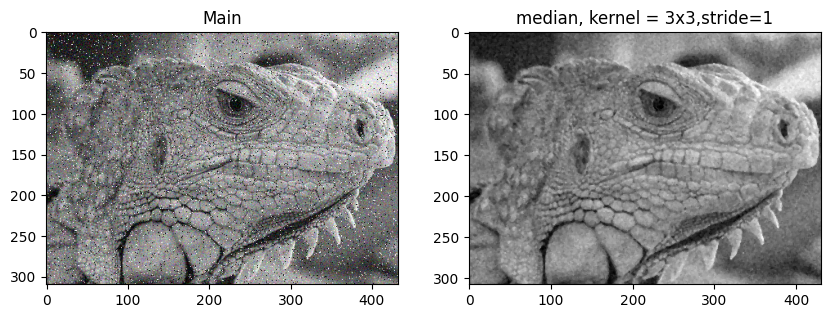

In [ ]:
#filtersize= 3*3 , stride=1
k = 3
stride=1
mode = "median"
out = imconvolution(img_noisy2, kernel_size = k,stride=stride, mode = mode)
fig, ax = plt.subplots(1,2, figsize =(10,12))
ax[0].imshow(cv2.cvtColor(img_noisy2, cv2.COLOR_BGR2RGB), cmap= "gray")
ax[1].imshow(out, cmap = "gray")
ax[0].set_title("Main")
ax[1].set_title(f"{mode}, kernel = {k}x{k},stride={stride}")
plt.show()

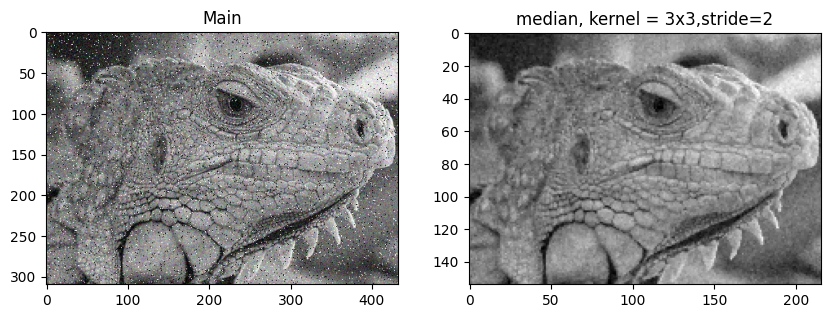

In [ ]:
#filtersize= 3*3 , stride=2
k = 3
stride=2
mode = "median"
out = imconvolution(img_noisy2, kernel_size = k,stride=stride, mode = mode)
fig, ax = plt.subplots(1,2, figsize =(10,12))
ax[0].imshow(cv2.cvtColor(img_noisy2, cv2.COLOR_BGR2RGB), cmap= "gray")
ax[1].imshow(out, cmap = "gray")
ax[0].set_title("Main")
ax[1].set_title(f"{mode}, kernel = {k}x{k},stride={stride}")
plt.show()

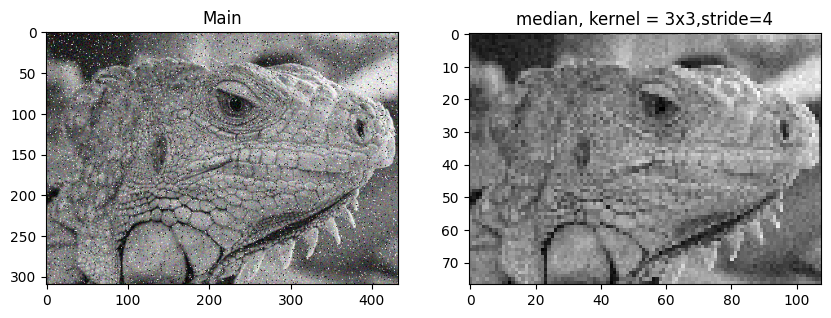

In [ ]:
#filtersize= 3*3 , stride=4
k = 3
stride=4
mode = "median"
out = imconvolution(img_noisy2, kernel_size = k,stride=stride, mode = mode)
fig, ax = plt.subplots(1,2, figsize =(10,12))
ax[0].imshow(cv2.cvtColor(img_noisy2, cv2.COLOR_BGR2RGB), cmap= "gray")
ax[1].imshow(out, cmap = "gray")
ax[0].set_title("Main")
ax[1].set_title(f"{mode}, kernel = {k}x{k},stride={stride}")
plt.show()

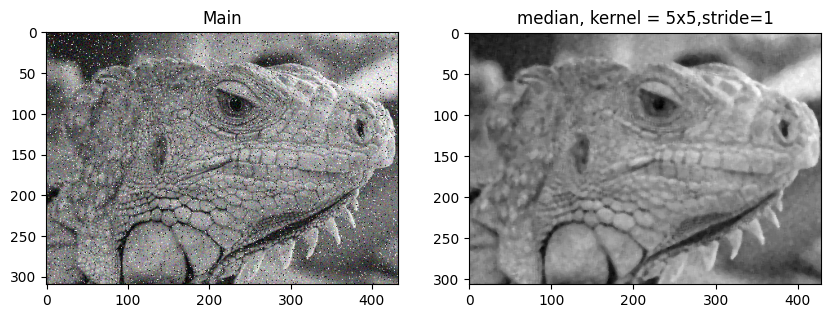

In [ ]:
#filtersize= 5*5 , stride=1
k = 5
stride=1
mode = "median"
out = imconvolution(img_noisy2, kernel_size = k,stride=stride, mode = mode)
fig, ax = plt.subplots(1,2, figsize =(10,12))
ax[0].imshow(cv2.cvtColor(img_noisy2, cv2.COLOR_BGR2RGB), cmap= "gray")
ax[1].imshow(out, cmap = "gray")
ax[0].set_title("Main")
ax[1].set_title(f"{mode}, kernel = {k}x{k},stride={stride}")
plt.show()

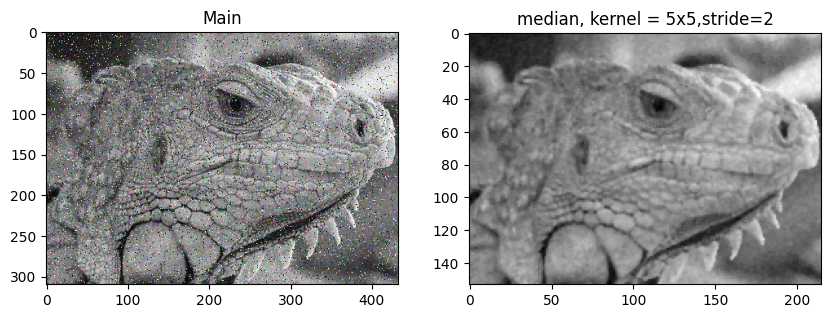

In [ ]:
#filtersize= 5*5 , stride=2
k = 5
stride=2
mode = "median"
out = imconvolution(img_noisy2, kernel_size = k,stride=stride, mode = mode)
fig, ax = plt.subplots(1,2, figsize =(10,12))
ax[0].imshow(cv2.cvtColor(img_noisy2, cv2.COLOR_BGR2RGB), cmap= "gray")
ax[1].imshow(out, cmap = "gray")
ax[0].set_title("Main")
ax[1].set_title(f"{mode}, kernel = {k}x{k},stride={stride}")
plt.show()

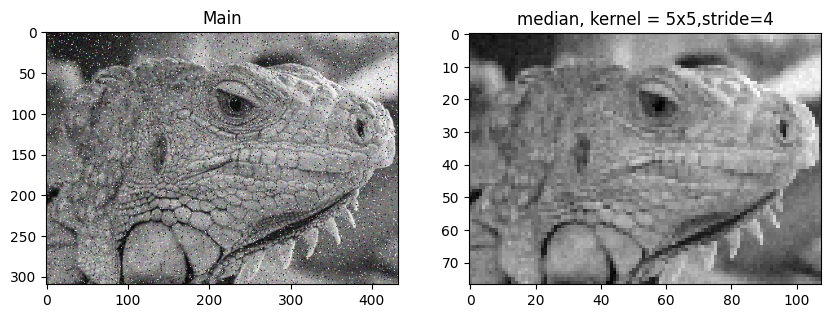

In [ ]:
#filtersize= 5*5 , stride=4
k = 5
stride=4
mode = "median"
out = imconvolution(img_noisy2, kernel_size = k,stride=stride, mode = mode)
fig, ax = plt.subplots(1,2, figsize =(10,12))
ax[0].imshow(cv2.cvtColor(img_noisy2, cv2.COLOR_BGR2RGB), cmap= "gray")
ax[1].imshow(out, cmap = "gray")
ax[0].set_title("Main")
ax[1].set_title(f"{mode}, kernel = {k}x{k},stride={stride}")
plt.show()

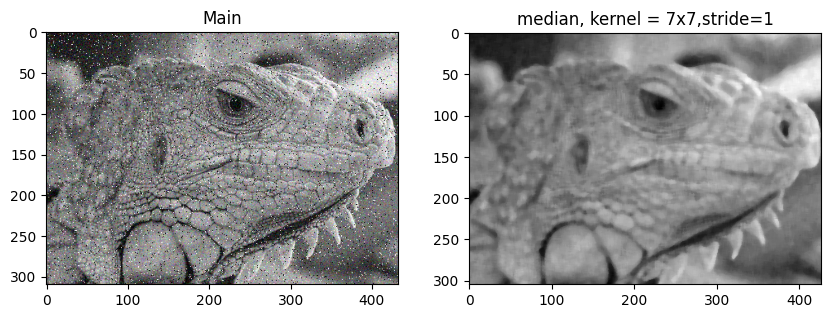

In [ ]:
#filtersize= 7*7 , stride=1
k = 7
stride=1
mode = "median"
out = imconvolution(img_noisy2, kernel_size = k,stride=stride, mode = mode)
fig, ax = plt.subplots(1,2, figsize =(10,12))
ax[0].imshow(cv2.cvtColor(img_noisy2, cv2.COLOR_BGR2RGB), cmap= "gray")
ax[1].imshow(out, cmap = "gray")
ax[0].set_title("Main")
ax[1].set_title(f"{mode}, kernel = {k}x{k},stride={stride}")
plt.show()

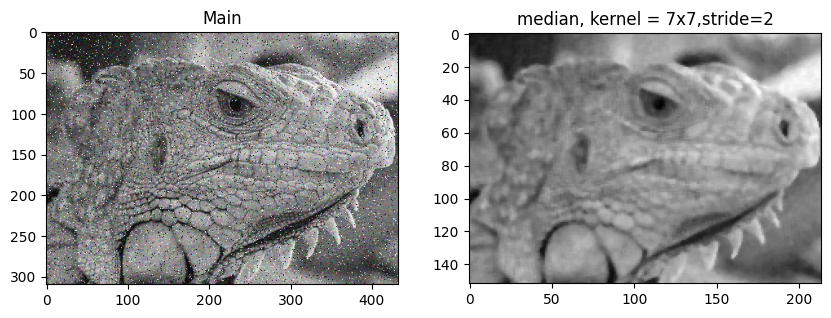

In [ ]:
#filtersize= 7*7 , stride=2
k = 7
stride=2
mode = "median"
out = imconvolution(img_noisy2, kernel_size = k,stride=stride, mode = mode)
fig, ax = plt.subplots(1,2, figsize =(10,12))
ax[0].imshow(cv2.cvtColor(img_noisy2, cv2.COLOR_BGR2RGB), cmap= "gray")
ax[1].imshow(out, cmap = "gray")
ax[0].set_title("Main")
ax[1].set_title(f"{mode}, kernel = {k}x{k},stride={stride}")
plt.show()

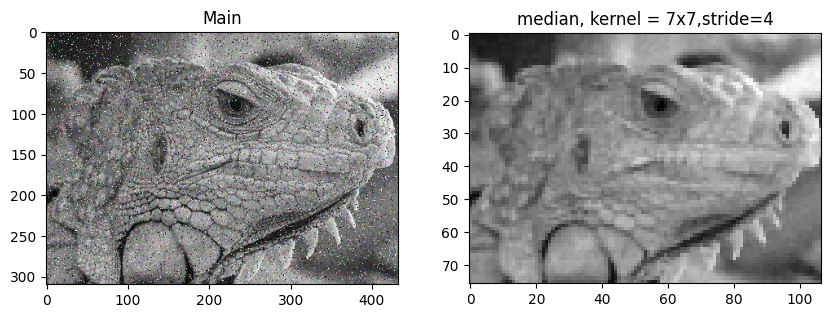

In [ ]:
#filtersize= 7*7 , stride=4
k = 7
stride=4
mode = "median"
out = imconvolution(img_noisy2, kernel_size = k,stride=stride, mode = mode)
fig, ax = plt.subplots(1,2, figsize =(10,12))
ax[0].imshow(cv2.cvtColor(img_noisy2, cv2.COLOR_BGR2RGB), cmap= "gray")
ax[1].imshow(out, cmap = "gray")
ax[0].set_title("Main")
ax[1].set_title(f"{mode}, kernel = {k}x{k},stride={stride}")
plt.show()

Gaussian Filter

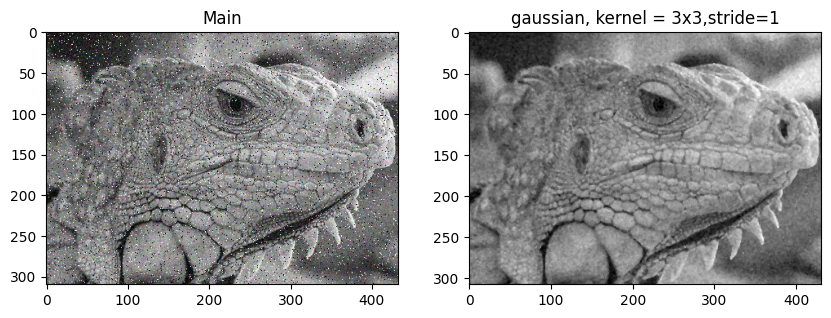

In [ ]:
#filtersize= 3*3 , stride=1
k = 3
stride=1
mode = "gaussian"
out = imconvolution(img_noisy2, kernel_size = k,stride=stride, mode = mode)
fig, ax = plt.subplots(1,2, figsize =(10,12))
ax[0].imshow(cv2.cvtColor(img_noisy2, cv2.COLOR_BGR2RGB), cmap= "gray")
ax[1].imshow(out, cmap = "gray")
ax[0].set_title("Main")
ax[1].set_title(f"{mode}, kernel = {k}x{k},stride={stride}")
plt.show()

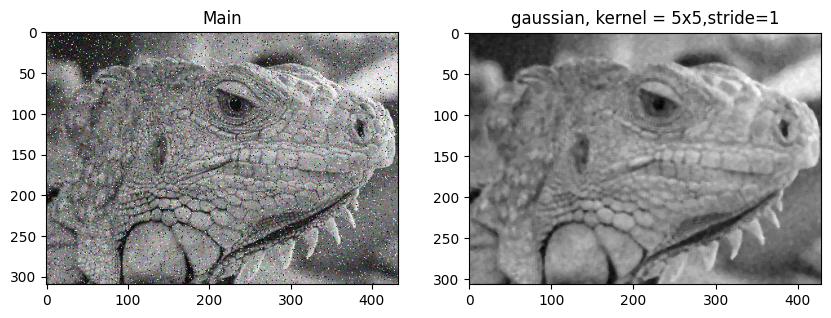

In [ ]:
#filtersize= 5*5 , stride=1
k = 5
stride=1
mode = "gaussian"
out = imconvolution(img_noisy2, kernel_size = k,stride=stride, mode = mode)
fig, ax = plt.subplots(1,2, figsize =(10,12))
ax[0].imshow(cv2.cvtColor(img_noisy2, cv2.COLOR_BGR2RGB), cmap= "gray")
ax[1].imshow(out, cmap = "gray")
ax[0].set_title("Main")
ax[1].set_title(f"{mode}, kernel = {k}x{k},stride={stride}")
plt.show()

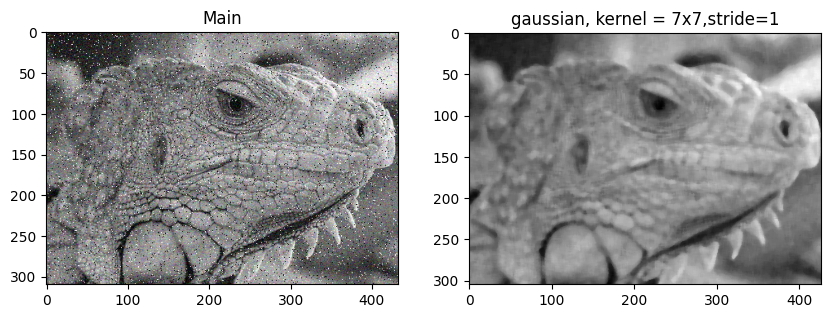

In [ ]:
#filtersize= 7*7 , stride=1
k = 7
stride=1
mode = "gaussian"
out = imconvolution(img_noisy2, kernel_size = k,stride=stride, mode = mode)
fig, ax = plt.subplots(1,2, figsize =(10,12))
ax[0].imshow(cv2.cvtColor(img_noisy2, cv2.COLOR_BGR2RGB), cmap= "gray")
ax[1].imshow(out, cmap = "gray")
ax[0].set_title("Main")
ax[1].set_title(f"{mode}, kernel = {k}x{k},stride={stride}")
plt.show()

Question 4

الف )

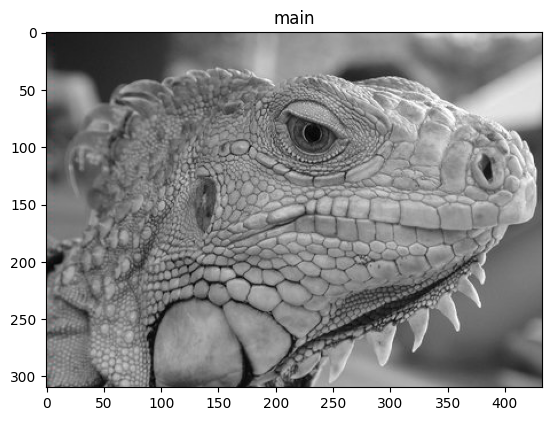

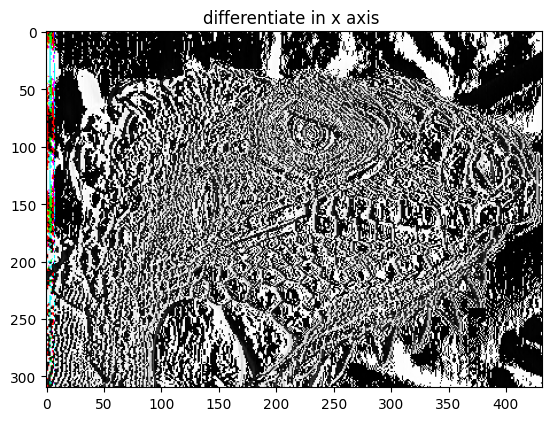

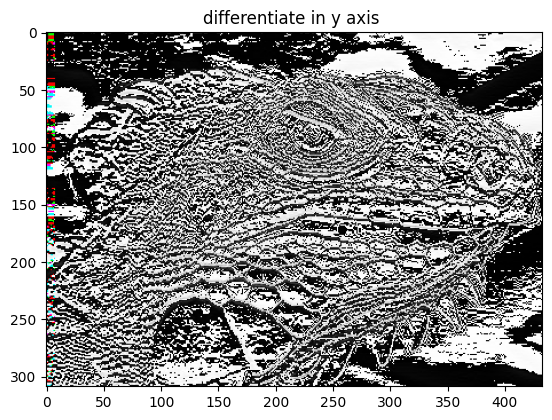

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


img = cv2.imread("iguana.png")
diff_imgX=np.zeros_like(img.astype(int))
diff_imgY=np.zeros_like(img.astype(int))
diff_imgX=np.diff(img,axis=1);
diff_imgY=np.diff(img,axis=0);
plt.figure(1)
plt.title('main')
plt.imshow(img)
plt.figure(2)
plt.title('differentiate in x axis ')
plt.imshow(diff_imgX)
plt.figure(3)
plt.title('differentiate in y axis ')
plt.imshow(diff_imgY)

پ )

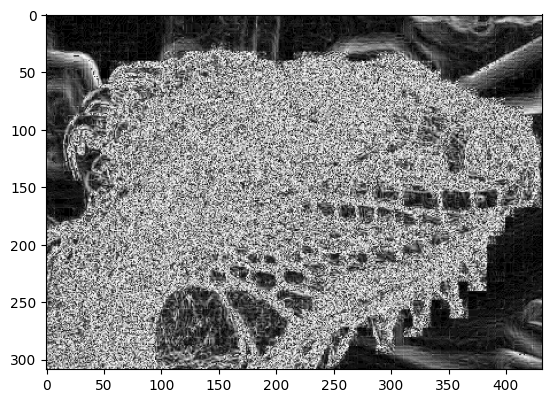

In [ ]:
import cv2
img = cv2.imread("iguana.png",0)
gX=np.zeros_like(img.astype(int))
gY=np.zeros_like(img.astype(int))
gX=np.diff(img,axis=1);
gY=np.diff(img,axis=0);
mag = np.sqrt((gX[:309,:] ** 2) + (gY[:,:432] ** 2))
orientation = np.arctan2(gY[:,:432], gX[:309,:]) * (180 / np.pi) % 180

plt.imshow(mag,cmap='gray')

ب )

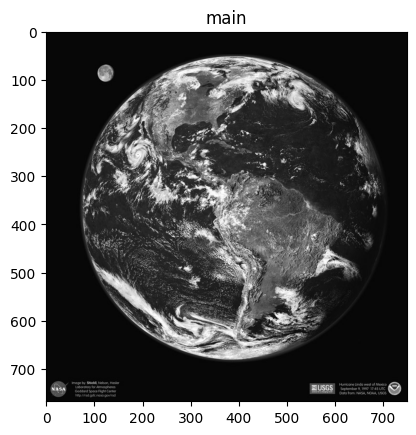

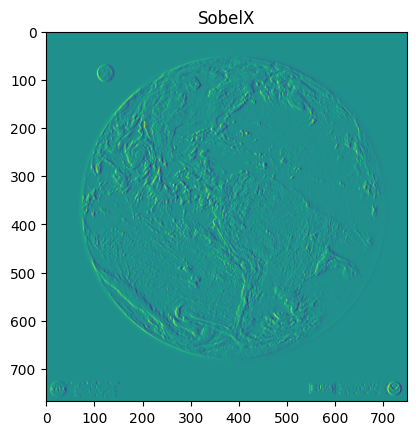

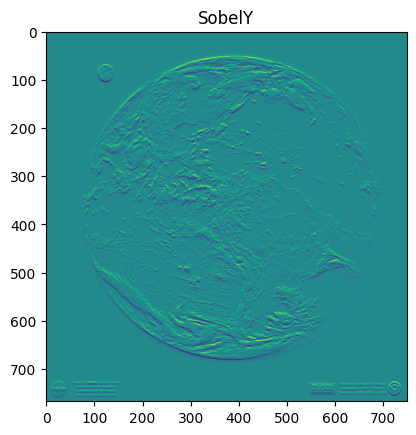

In [ ]:
import cv2
import numpy as np


img = cv2.imread('Earth.bmp', cv2.IMREAD_GRAYSCALE)


sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=5)
sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=5)
plt.figure(1)
plt.title('main')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.figure(2)
plt.title('SobelX')
plt.imshow(sobelx)
plt.figure(3)
plt.title('SobelY')
plt.imshow(sobely)

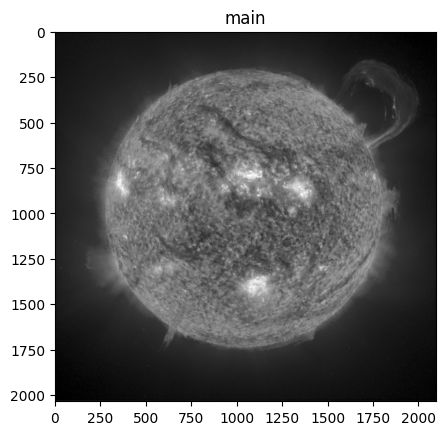

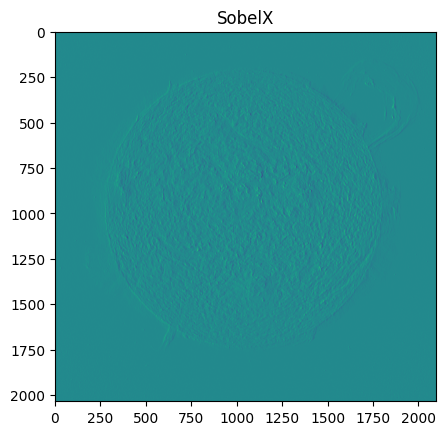

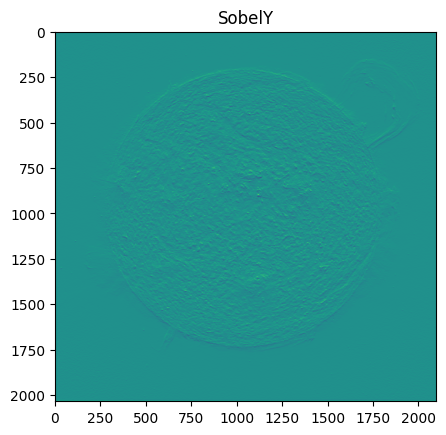

In [ ]:
import cv2
import numpy as np


img = cv2.imread('Sun.bmp', cv2.IMREAD_GRAYSCALE)


sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=5)
sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=5)
plt.figure(1)
plt.title('main')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.figure(2)
plt.title('SobelX')
plt.imshow(sobelx)
plt.figure(3)
plt.title('SobelY')
plt.imshow(sobely)

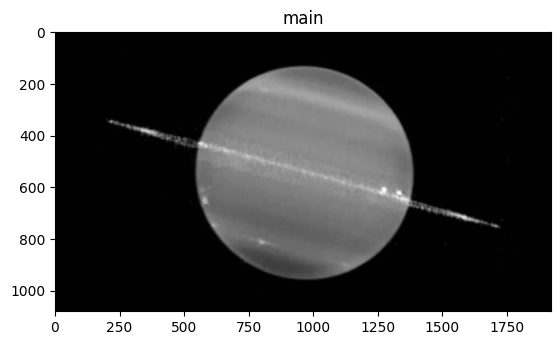

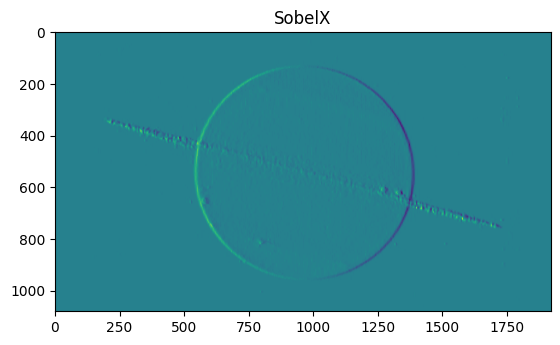

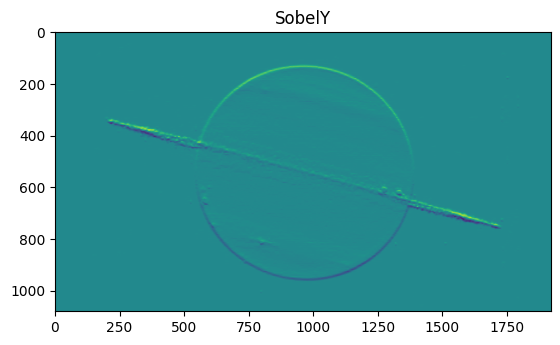

In [ ]:
import cv2
import numpy as np


img = cv2.imread('Uranus.bmp', cv2.IMREAD_GRAYSCALE)


sobelx = cv2.Sobel(img, cv2.CV_64F, 1, 0, ksize=3)
sobely = cv2.Sobel(img, cv2.CV_64F, 0, 1, ksize=3)
plt.figure(1)
plt.title('main')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.figure(2)
plt.title('SobelX')
plt.imshow(sobelx)
plt.figure(3)
plt.title('SobelY')
plt.imshow(sobely)

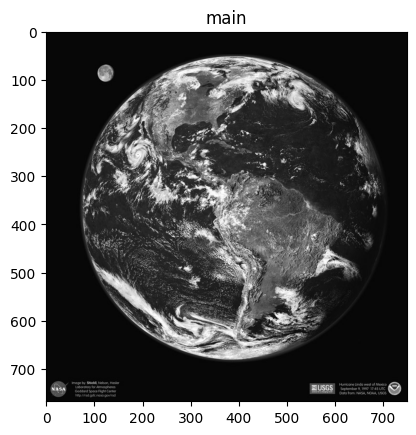

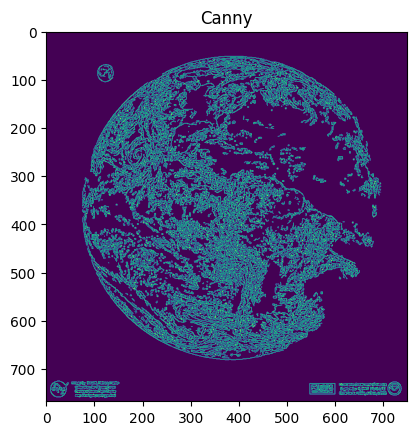

In [ ]:
import cv2
import numpy as np


img = cv2.imread('Earth.bmp', cv2.IMREAD_GRAYSCALE)


canny = cv2.Canny(img, 120, 200)

plt.figure(1)
plt.title('main')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.figure(2)
plt.title('Canny')
plt.imshow(canny)


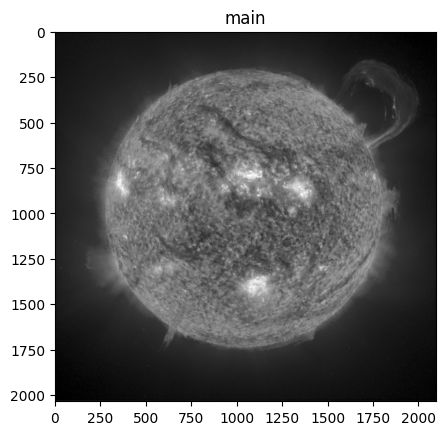

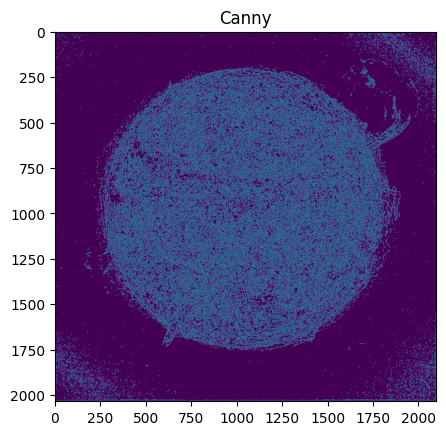

In [ ]:
import cv2
import numpy as np


img = cv2.imread('Sun.bmp', cv2.IMREAD_GRAYSCALE)


canny = cv2.Canny(img, 30, 50)

plt.figure(1)
plt.title('main')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.figure(2)
plt.title('Canny')
plt.imshow(canny)

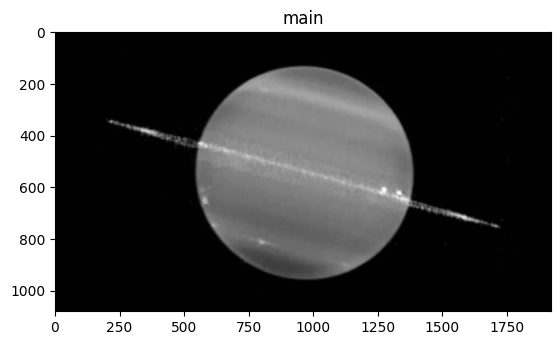

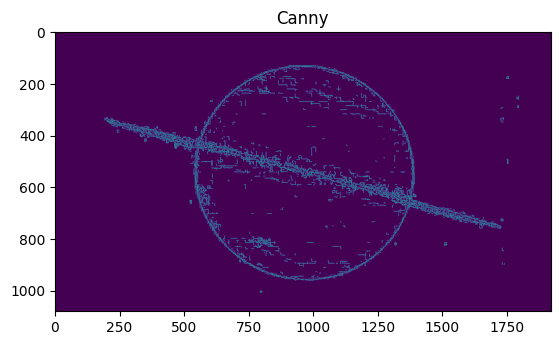

In [ ]:
import cv2
import numpy as np


img = cv2.imread('Uranus.bmp', cv2.IMREAD_GRAYSCALE)


canny = cv2.Canny(img,15, 25)

plt.figure(1)
plt.title('main')
plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
plt.figure(2)
plt.title('Canny')
plt.imshow(canny)

Question 5

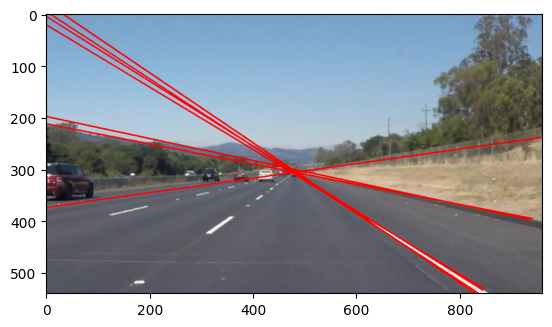

In [30]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load image
image = cv2.imread('road.jpg')

# Convert image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply Canny edge detection
edges = cv2.Canny(gray,140,130)

# Apply Hough Transform to detect lines
lines = cv2.HoughLines(edges, 1, np.pi/180,140)

# Draw detected lines on the original image
for line in lines:
    rho, theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a*rho
    y0 = b*rho
    x1 = int(x0 + 1000*(-b))
    y1 = int(y0 + 1000*(a))
    x2 = int(x0 - 1000*(-b))
    y2 = int(y0 - 1000*(a))
    cv2.line(image, (x1,y1), (x2,y2), (0,0,255), 2)

# Display the result
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

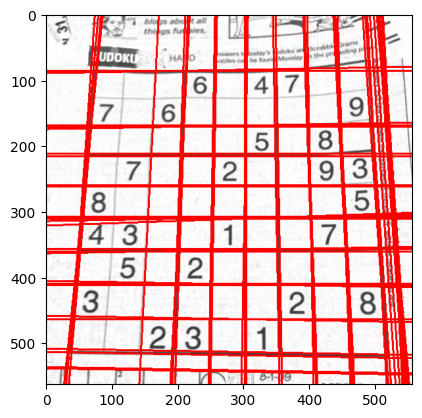

In [ ]:
import cv2
import numpy as np

# Load image
image = cv2.imread('sudoku.png')

# Convert image to grayscale
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# Apply Canny edge detection
edges = cv2.Canny(gray,320, 170)

# Apply Hough Transform to detect lines
lines = cv2.HoughLines(edges, 1, np.pi/180,160)

# Draw detected lines on the original image
for line in lines:
    rho, theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a*rho
    y0 = b*rho
    x1 = int(x0 + 1000*(-b))
    y1 = int(y0 + 1000*(a))
    x2 = int(x0 - 1000*(-b))
    y2 = int(y0 - 1000*(a))
    cv2.line(image, (x1,y1), (x2,y2), (0,0,255), 2)

# Display the result
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

In [ ]:
zc